In [122]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [124]:
import warnings

import matplotlib

# import seaborn as sns
import numpy as np
import pandas as pd
import seaborn as sns

# import xarray as xr
from joblib import dump, load
from matplotlib import cm
from matplotlib import pyplot as plt
from sklearn.inspection import PartialDependenceDisplay, permutation_importance
matplotlib.rcParams['figure.dpi'] = 300
warnings.simplefilter(action="ignore", category=FutureWarning)
import json

In [125]:
# labels dictionary
with open('../../../var_labels.json', "r") as fp:
    # Load the dictionary from the file
    labels_dict = json.load(fp)

## day

In [129]:
# load data
X_train = pd.read_csv("xtrain.csv", index_col=0)
y_train = pd.read_csv("ytrain.csv", index_col=0)
X_test = pd.read_csv("xtest.csv", index_col=0)
y_test = pd.read_csv("ytest.csv", index_col=0)
groups = X_train["groups"]
X_train = X_train.drop(columns="groups")
feature_names = list(X_train.columns)

In [130]:
# load model
model_day = load("forest.joblib")
best_model = model_day.best_estimator_

In [131]:
# Validation on test set
print(
    "Validation score:\ntraining set: r2 = {:3.2f}\ntest set: r2 = {:3.2f}".format(
        best_model.score(X_train, y_train), best_model.score(X_test, y_test)
    )
)

Validation score:
training set: r2 = 0.99
test set: r2 = 0.91


### feature importance


#### permutation - test set

In [136]:
color_list = ["#19535f", "#0b7a75", "#d7c9aa", "#ed6a5e", "#7b2d26"]

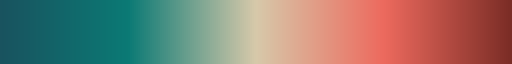

In [137]:
matplotlib.colors.LinearSegmentedColormap.from_list("name", color_list)

In [138]:
forest_FI = pd.read_csv("forest_FI.csv", index_col=0)

In [140]:
forest_importances = forest_FI[-10:].rename(index=labels_dict)

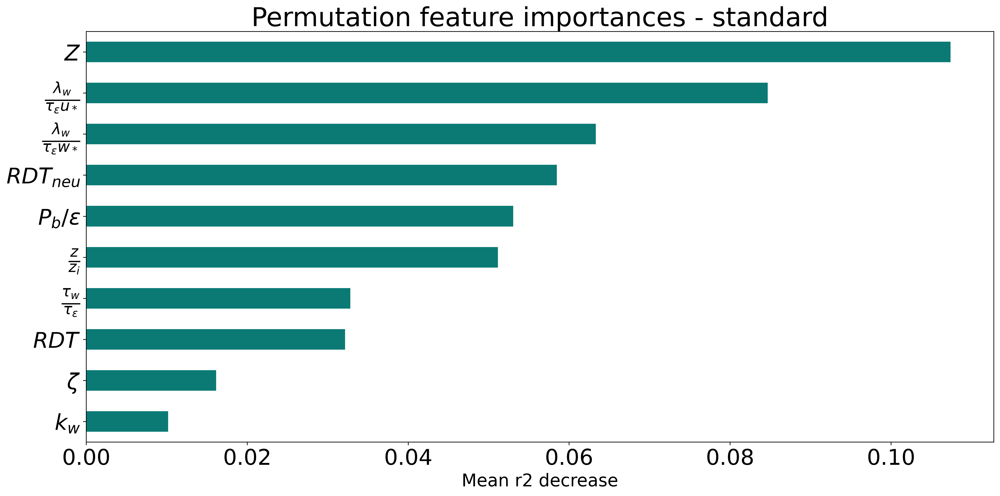

In [142]:
# plot permutation feature importances
fig, ax = plt.subplots(figsize=(16, 8))
forest_importances.plot.barh(ax=ax, legend=False, color="#0b7a75")
ax.set_title("Permutation feature importances - standard", fontsize=30)
ax.set_xlabel("Mean r2 decrease", fontsize=20)
for item in ax.get_xticklabels() + ax.get_yticklabels():
    item.set_fontsize(25)
fig.tight_layout()

In [144]:
REE_FI = pd.read_csv("REE_FI.csv", index_col=0)
forest_importances = REE_FI[-10:].rename(
    index=labels_dict
)

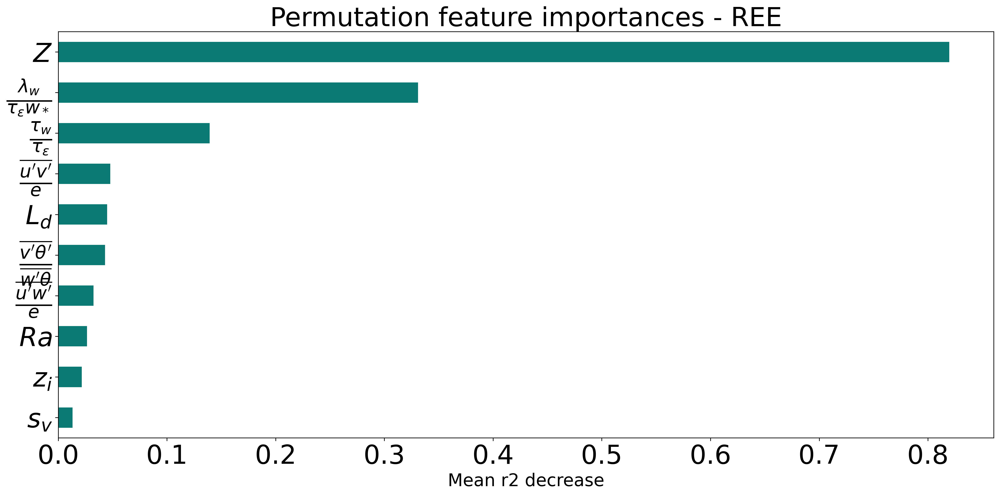

In [147]:
# plot permutation feature importances
fig, ax = plt.subplots(figsize=(16, 8))
forest_importances.plot.barh(ax=ax, legend=False, color="#0b7a75")
ax.set_title("Permutation feature importances - REE", fontsize=30)
ax.set_xlabel("Mean r2 decrease", fontsize=20)
for item in ax.get_xticklabels() + ax.get_yticklabels():
    item.set_fontsize(30)
fig.tight_layout()

#### heatmap comparison

In [149]:
ree_list = REE_FI.index[::-1]
forest_list = forest_FI.index[::-1]

In [150]:
color_list = ["#0a706b", "#f9f6f1", "#a51f12"]
cmap = matplotlib.colors.LinearSegmentedColormap.from_list("name", color_list)

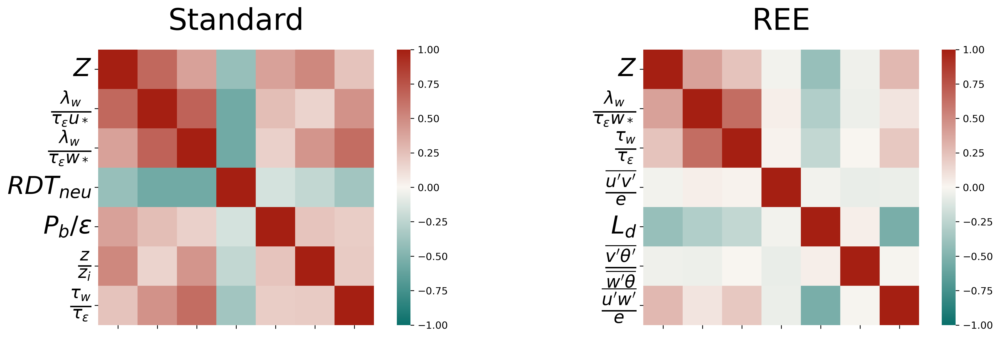

In [151]:
# correlation
correlations_ree = X_train[ree_list[0:7]].corr()
correlations_forest = X_train[forest_list[0:7]].corr()

# rename for shortness
correlations_ree = correlations_ree.rename(
    columns=labels_dict,
    index=labels_dict,
)
correlations_forest = correlations_forest.rename(
    columns=labels_dict,
    index=labels_dict,
)

# plot
fig, axs = plt.subplots(1, 2, figsize=(18, 5))

axs[0].set_aspect(1)
axs[0].set_title("Standard", fontsize=30, pad=20)
axs[1].set_aspect(1)
axs[1].set_title("REE", fontsize=30, pad=20)

sns.heatmap(correlations_forest, cmap=cmap, ax=axs[0], vmin=-1, vmax=1)
sns.heatmap(correlations_ree, cmap=cmap, ax=axs[1], vmin=-1, vmax=1)

for ax in axs:
    for item in ax.get_yticklabels():
        item.set_fontsize(25)
        item.set_rotation(0)
    ax.set_xticklabels([])

In [153]:
correlations_forest.to_csv('../../../Perdigao_ML/Daytime/corr_metcrax.csv')
correlations_ree.to_csv('../../../Perdigao_ML/Daytime/corr_ree_metcrax.csv')

# paper figure

In [85]:
def names_to_labels(features):
    labels=[]
    for feat in features:
        labels.append(labels_dict[feat])
    return labels

In [87]:
# load shap_vaues from cluster calculation
import shap

shap_values = load("shap_values.joblib")


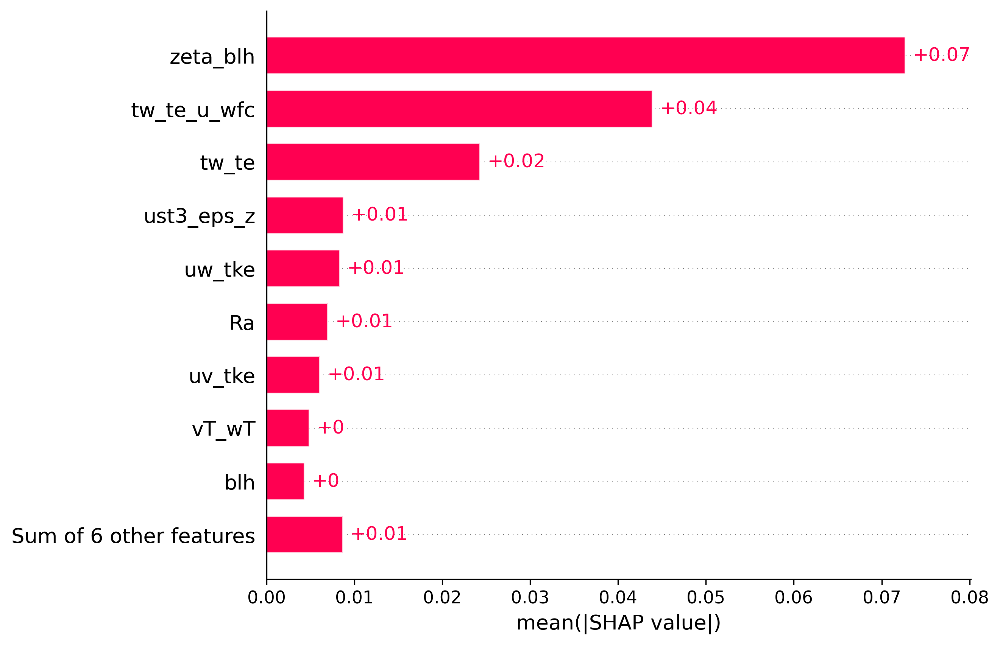

In [89]:
# get best feats
shap.plots.bar(shap_values, show=False)
labels = plt.gca().get_yticklabels()
labels = [lab.get_text() for lab in labels]
labels.remove('Sum of 6 other features')
labels.remove('Sum of 6 other features')

In [90]:
# change labels
new_labels=names_to_labels(labels)

In [92]:
color_list = ["#19535f", "#0b7a75", "#d7c9aa", "#ed6a5e", "#7b2d26"]
cmap = matplotlib.colors.LinearSegmentedColormap.from_list("name", color_list)

In [95]:
def plot_shap_beeswarm(shap_values, features, cmap=None, ax=None, show_colorbar=True, **figargs):

    if cmap is None:
        cmap = plt.cm.get_cmap('viridis')
    # create axis if necessary
    if ax is None:
        fig = plt.figure(**figargs)
        ax=plt.gca()
    else:
        fig=plt.gcf()
    # beeswarm plot
    for i, label in enumerate(features):
        row = len(features)-i-1
        shaps = shap_values[:,label].values
        data = shap_values[:,label].data
        N=len(shaps)
        nbins = 100
        row_height = 0.4
        quant = np.round(nbins * (shaps - np.min(shaps)) / (np.max(shaps) - np.min(shaps) + 1e-8))
        inds_ = np.argsort(quant + np.random.randn(N) * 1e-6)
        layer = 0
        last_bin = -1
        ys = np.zeros(N)
        for ind in inds_:
            if quant[ind] != last_bin:
                layer = 0
            ys[ind] = np.ceil(layer / 2) * ((layer % 2) * 2 - 1)
            layer += 1
            last_bin = quant[ind]
        ys *= 0.9 * (row_height / np.max(ys + 1))
        ax.scatter(shaps, row + ys, cmap=cmap, c=data, vmin=data.min(), vmax=data.max())

    # embellishments
    ax.yaxis.set_ticks(np.arange(len(features)), labels=features[::-1])
    ax.axvline(x=0, color="#999999", zorder=-1)
    ax.set_xlabel("SHAP values", fontsize=20)
    ax.set_title("SHAP", fontsize=30)
    for item in ax.get_xticklabels():
        item.set_fontsize(15)
    for item in ax.get_yticklabels():
        item.set_fontsize(20)
    # colorbar
    if show_colorbar:
        m = cm.ScalarMappable(cmap=cmap)
        m.set_array([0, 1])
        cb = fig.colorbar(m, ax=ax, ticks=[0, 1], aspect=50)
        cb.set_ticklabels(['Low', 'High'])
        cb.set_label('Feature values', size=20, labelpad=0)
        cb.ax.tick_params(labelsize=15, length=0)
        cb.set_alpha(1)
        cb.outline.set_visible(False)  # type: ignore
    
    return ax

<Axes: title={'center': 'SHAP'}, xlabel='SHAP values'>

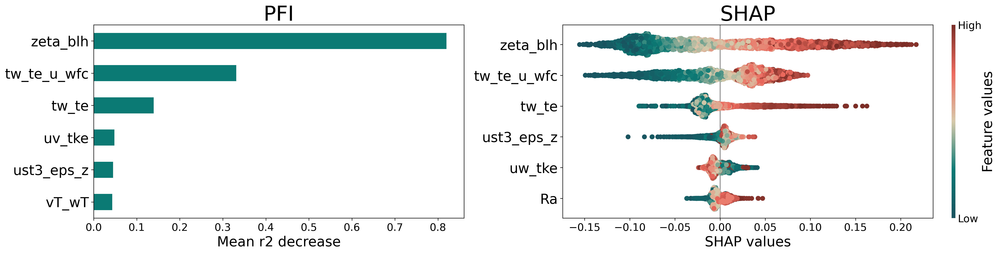

In [97]:
import matplotlib.gridspec as gridspec

fig, axs = plt.subplots(1, 2, figsize=(20, 5), constrained_layout=True)

# feature importance
ax1 = axs[0]
forest_importances = REE_FI[-6:]
forest_importances.plot.barh(ax=ax1, legend=False, color="#0b7a75")
ax1.set_title("PFI", fontsize=30)
ax1.set_xlabel("Mean r2 decrease", fontsize=20)
for item in ax1.get_xticklabels():
    item.set_fontsize(15)
for item in ax1.get_yticklabels():
    item.set_fontsize(20)


ax2 = axs[1]
plt.axes(ax2)
features=labels[:6]
plot_shap_beeswarm(shap_values, features, cmap=cmap, ax=ax2)


# add panel letter

Text(0.5, 0.98, 'Individual dependencies')

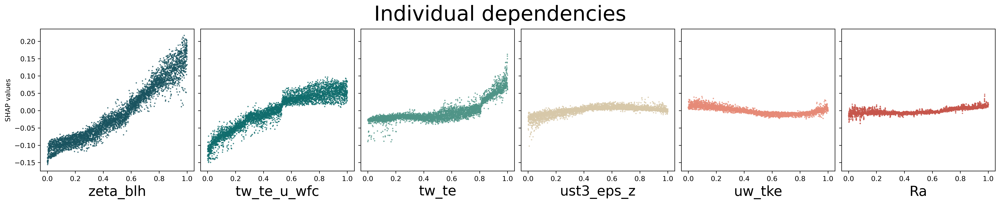

In [98]:
fig, axs = plt.subplots(1, len(features), figsize=(20, 4), constrained_layout=True, sharey=True)
for i, ax in zip(range(len(features)), axs):
    feat=features[i]
    ax.scatter(shap_values[:,feat].data, shap_values[:,feat].values, color=cmap(i/len(features)), alpha=0.7, s=1)
    ax.set_xlabel(feat, fontsize=20)
axs[0].set_ylabel('SHAP values')
fig.suptitle('Individual dependencies', fontsize=30)

In [99]:
from sklearn.preprocessing import QuantileTransformer

X_scaled = QuantileTransformer().fit_transform(X_train, )
X_scaled = pd.DataFrame(X_scaled, columns=X_train.columns)
y_scaled = QuantileTransformer().fit_transform(y_train, )

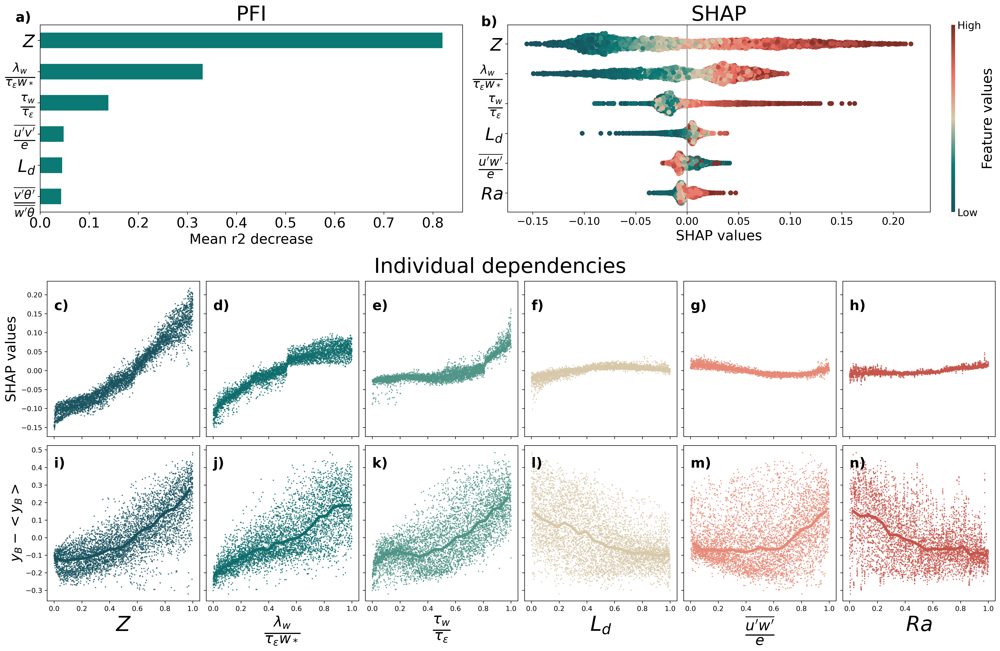

In [101]:
fig = plt.figure(layout='constrained', figsize=(20,13))
subfigs = fig.subfigures(2,1, height_ratios=[5,8])

axs = subfigs[0].subplots(1, 2)
# feature importance
ax1 = axs[0]
forest_importances = REE_FI[-6:].rename(index=labels_dict)
forest_importances.plot.barh(ax=ax1, legend=False, color="#0b7a75")
ax1.set_title("PFI", fontsize=30)
ax1.set_xlabel("Mean r2 decrease", fontsize=20)
for item in ax1.get_xticklabels():
    item.set_fontsize(20)
for item in ax1.get_yticklabels():
    item.set_fontsize(25)
ax1.text(-0.05, 5.6, 'a)', fontsize=20, fontweight='bold')

# shap beeswarm plot
ax2 = axs[1]
features=labels[:6]
plot_shap_beeswarm(shap_values, features, cmap=cmap, ax=ax2)
ax2.set_xlabel("SHAP values", fontsize=20)
ax2.set_title("SHAP", fontsize=30)
for item in ax2.get_xticklabels():
    item.set_fontsize(15)
for item in ax2.get_yticklabels():
    item.set_fontsize(25)
ax2.text(-0.2, 5.6, 'b)', fontsize=20, fontweight='bold')
ax2.yaxis.set_ticks(np.arange(len(features)), labels=new_labels[:6][::-1])

# individual dependencies
axs2 =  subfigs[1].subplots(2, len(features), sharey='row', sharex=True)
axs=axs2[0,:]
for i, ax in zip(range(len(features)), axs):
    feat=features[i]
    label=new_labels[i]
    ax.scatter(shap_values[:,feat].data, shap_values[:,feat].values, color=cmap(i/len(features)), alpha=0.7, s=1)
axs[0].set_ylabel('SHAP values', fontsize=20)
subfigs[1].suptitle('Individual dependencies', fontsize=30)

for a, label in zip(axs, ['c)', 'd)', 'e)', 'f)', 'g)', 'h)']):
    a.text(0, 0.16, label, fontsize=20, fontweight='bold')

axs=axs2[1,:]
bins = np.linspace(0,1,num=20)
bin_labels= (bins[1:]+bins[:-1])/2
# individual dependencies
for i, ax in zip(range(len(features)), axs):
    feat=features[i]
    label=new_labels[i]
    ax.scatter(X_scaled[feat], (y_train-y_train.mean()), color=cmap(i/len(features)), alpha=0.7, s=1)
    ax.set_xlabel(label, fontsize=30)
    # median line
    X_bin = X_scaled.groupby(pd.cut(X_scaled[feat], bins, labels=bin_labels),).median()
    y_bin = (y_train-y_train.mean()).groupby(pd.cut(X_scaled[feat], bins, labels=bin_labels),).median()
    ax.plot(X_bin[feat],y_bin,color=cmap(i/len(features)), linewidth=4)
axs[0].set_ylabel(r'$y_B-<y_B>$', fontsize=20)

for a, label in zip(axs, ['i)', 'j)', 'k)', 'l)', 'm)', 'n)']):
    a.text(0, 0.4, label, fontsize=20, fontweight='bold')
    
plt.savefig('Metcrax_daytime_FI.png')


## with barplot of variances explained

In [103]:
from tqdm import tqdm

In [105]:
forest_list = list(REE_FI[-6:].index)[::-1]

scores = []
vars_forest = []

for var_forest in tqdm(forest_list):
    vars_forest.append(var_forest)
    best_model.fit(X_train[vars_forest],y_train)
    score_rf = best_model.score(X_test[vars_forest],y_test)
    scores.append(score_rf)
scores = np.array(scores)

100%|██████████| 6/6 [00:34<00:00,  5.77s/it]


In [106]:
scores_diff = [scores[0]]+[scores[i]-scores[i-1] for i in [1,2,3,4,5]]

<BarContainer object of 6 artists>

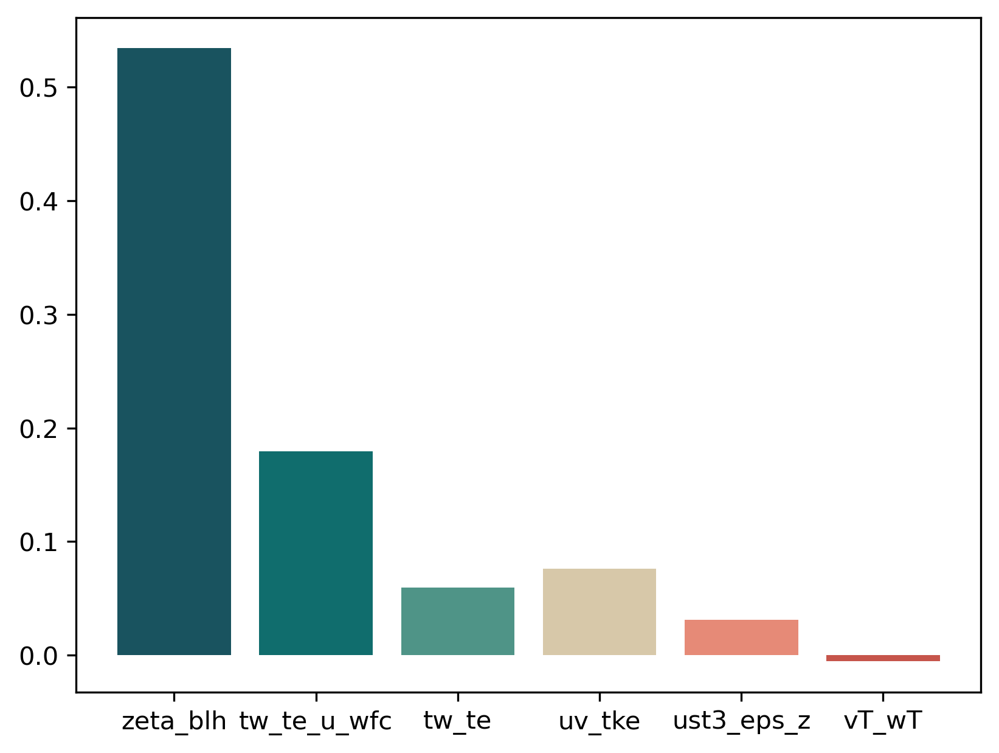

In [107]:
color_list=[cmap(i/6) for i in range(6)]
plt.bar(forest_list,scores_diff, color=color_list)

In [108]:
labels_pfi=[labels_dict[var] for var in forest_list]

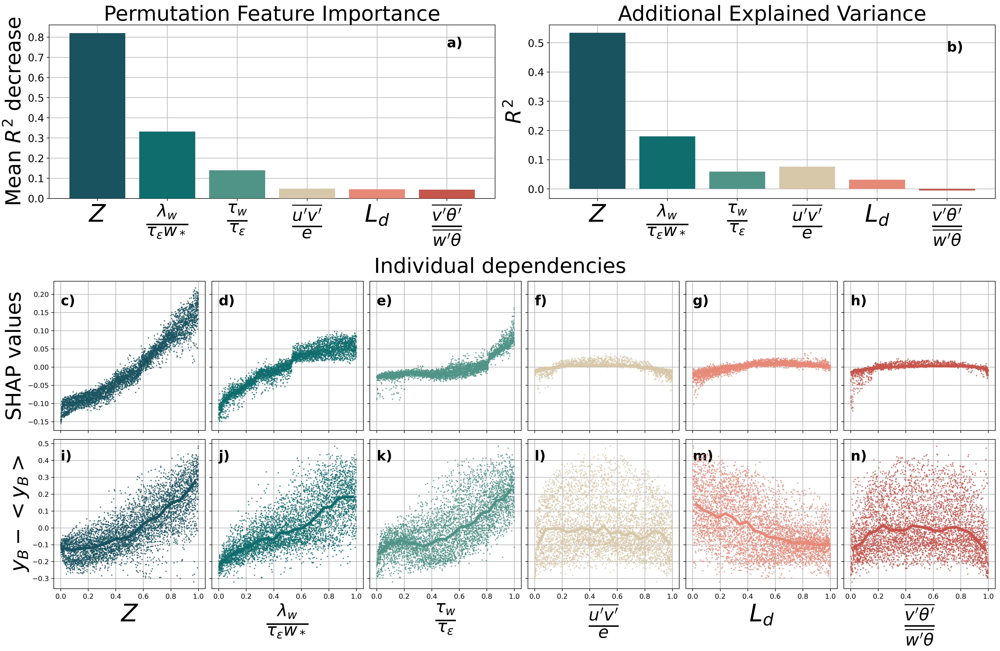

In [111]:
color_list=[cmap(i/6) for i in range(6)]

fig = plt.figure(layout='constrained', figsize=(20,13))
subfigs = fig.subfigures(2,1, height_ratios=[5,8])
axs = subfigs[0].subplots(1, 2)
# feature importance
ax1 = axs[0]
forest_importances = REE_FI[-6:].rename(index=labels_dict)[::-1]
ax1.bar(labels_pfi,forest_importances.values.flatten(), color=color_list, zorder=4)
ax1.set_title("Permutation Feature Importance", fontsize=30)
ax1.set_ylabel("Mean $R^2$ decrease", fontsize=30)
for item in ax1.get_xticklabels():
    item.set_fontsize(35)
for item in ax1.get_yticklabels():
    item.set_fontsize(15)
ax1.text(5, 0.75, 'a)', fontsize=20, fontweight='bold')
ax1.grid(zorder=2)

# variance explained plot
ax2 = axs[1]

ax2.bar(labels_pfi,scores_diff, color=color_list, zorder=4)
ax2.set_ylabel("$R^2$", fontsize=30)
ax2.set_title("Additional Explained Variance", fontsize=30)
for item in ax2.get_xticklabels():
    item.set_fontsize(35)
for item in ax2.get_yticklabels():
    item.set_fontsize(15)
ax2.text(5, 0.47, 'b)', fontsize=20, fontweight='bold')
# ax2.yaxis.set_ticks(np.arange(len(features)), labels=new_labels[:6][::-1])
ax2.grid(zorder=2)

# individual dependencies
axs2 =  subfigs[1].subplots(2, len(features), sharey='row', sharex=True)
axs=axs2[0,:]
for i, ax in zip(range(len(forest_list)), axs):
    feat=forest_list[i]
    label=labels_pfi[i]
    ax.scatter(shap_values[:,feat].data, shap_values[:,feat].values, color=cmap(i/len(features)), alpha=0.7, s=1, zorder=4)
    ax.grid(zorder=2)

axs[0].set_ylabel('SHAP values', fontsize=30)
subfigs[1].suptitle('Individual dependencies', fontsize=30)

for a, label in zip(axs, ['c)', 'd)', 'e)', 'f)', 'g)', 'h)']):
    a.text(0, 0.17, label, fontsize=20, fontweight='bold')


axs=axs2[1,:]
bins = np.linspace(0,1,num=20)
bin_labels= (bins[1:]+bins[:-1])/2
# individual dependencies
for i, ax in zip(range(len(forest_list)), axs):
    feat=forest_list[i]
    label=labels_pfi[i]
    ax.scatter(X_scaled[feat], (y_train-y_train.mean()), color=cmap(i/len(forest_list)), alpha=0.7, s=1, zorder=4)
    ax.set_xlabel(label, fontsize=35)
    ax.grid(zorder=2)
    # median line
    X_bin = X_scaled.groupby(pd.cut(X_scaled[feat], bins, labels=bin_labels),).median()
    y_bin = (y_train-y_train.mean()).groupby(pd.cut(X_scaled[feat], bins, labels=bin_labels),).median()
    ax.plot(X_bin[feat],y_bin,color=cmap(i/len(features)), linewidth=4)

axs[0].set_ylabel(r'$y_B-<y_B>$', fontsize=30)

for a, label in zip(axs, ['i)', 'j)', 'k)', 'l)', 'm)', 'n)']):
    a.text(0, 0.4, label, fontsize=20, fontweight='bold')
    
plt.savefig('Metcrax_daytime_FI.png')
